In [ ]:
import os
import sys
# block warnings from printing
import warnings
warnings.filterwarnings('ignore')
warnings.simplefilter('ignore')

import xarray as xr
xr.set_options(keep_attrs=True)
import numpy as np
np.seterr(divide='ignore', invalid='ignore')

import cartopy
cartopy.config['data_dir'] = "/discover/nobackup/projects/jh_tutorials/JH_examples/JH_datafiles/Cartopy"
cartopy.config['pre_existing_data_dir'] = "/discover/nobackup/projects/jh_tutorials/JH_examples/JH_datafiles/Cartopy"
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER
from shapely.geometry.polygon import LinearRing

import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import matplotlib.gridspec as gridspec
import matplotlib.ticker as mticker
import matplotlib.colors as mcolors
from matplotlib.colors import TwoSlopeNorm
from matplotlib import cm
from matplotlib.colors import ListedColormap,LinearSegmentedColormap
import cmocean.cm as cmo

# settings
%config InlineBackend.figure_format = 'retina'

# add path to custom functions
module_path = os.path.abspath(os.path.join('..'))
if module_path not in sys.path:
    sys.path.append(module_path+"/py_functions")
from map_plot_tools import *
from colorbar_funcs import *
from data_funcs import *
from stats_funcs import *

In [10]:
### +++ DATA PATHS +++ ###

obs_prods     = ['merra2']
flor_runs     = ['ctrl', 'hitopo']
flor_simNames = ['ctrl', 'hitopo']

dpath0 = '/discover/nobackup/projects/giss/baldwin_nip/dmkumar'
opath  = '/home/dmkumar/JupyterLinks/notebooks/topo_nam/figs'

files = {
    'obs':   {'merra2': {}},
    'pi':    {'ctrl': {}, 'hitopo': {}},
    '2xco2': {'ctrl': {}, 'hitopo': {}},
    'topo':  {}
}

files['obs']['merra2']['h500'] = f'{dpath0}/obs_data/merra2/merra2.H.1980-2022.monthly.nc'

for run, simName in zip(flor_runs, flor_simNames):
    files['pi'][run]['h500']    = f'{dpath0}/FLOR/{run}/pi/flor.{simName}.h500.monthly.nc'
    files['2xco2'][run]['h500'] = f'{dpath0}/FLOR/{run}/2xco2/flor.{simName}.2xco2.h500.monthly.nc'

files['topo']['etopo']  = f'{dpath0}/topo_files/obs.etopo5.zsurf.nc'
files['topo']['ctrl']   = f'{dpath0}/topo_files/flor.ctrl.zsurf.nc'
files['topo']['hicam']  = f'{dpath0}/topo_files/flor.cam.zsurf.nc'
files['topo']['hitopo'] = f'{dpath0}/topo_files/flor.hitopo.zsurf.nc'

In [3]:
### +++ LOAD DATA +++ ###

n_years     = 100
n_keep_mons = -1 * (n_years * 12)

dat = {
    'obs':    {'merra2': {} },
    'pi':     {'ctrl': {}, 'hitopo': {} },
    '2xco2':  {'ctrl': {}, 'hitopo': {} },
}

print('Loading data...')

# MERRA-2
ds = xr.open_dataset(files['obs']['merra2']['h500'])['H'].sel(lev=500).squeeze(drop=True)
dat['obs']['merra2']['h500']   = lonFlip(ds)
dat['obs']['merra2']['swp500'] = dat['obs']['merra2']['h500'] - dat['obs']['merra2']['h500'].mean(dim='lon')
del ds

# FLOR
for case in ['pi','2xco2']:
    for run in flor_runs:
        ds = xr.open_dataset(files[case][run]['h500'])['h500'][n_keep_mons:].rename({'grid_xt': 'lon', 'grid_yt': 'lat'})
        dat[case][run]['h500']   = ds
        dat[case][run]['swp500'] = ds - ds.mean(dim='lon') # calculate stationary wave pattern
        del ds

# Surface topography
topo = {}
ds = xr.open_dataset(files['topo']['etopo']).ROSE.rename({'ETOPO05_X': 'lon', 'ETOPO05_Y': 'lat'})
topo['etopo'] = ds.where(ds > 0, np.nan)
del ds
for run in flor_runs:
    ds = xr.open_dataset(files['topo'][run]).ZSURF.rename({'GRID_XT': 'lon', 'GRID_YT': 'lat'})
    topo[run] = ds.where(ds > 0, np.nan)
    del ds

print('Done.')

Loading data...
Done.


In [4]:
### +++ JAS SEASONAL MEANS +++ ###
season = 'JAS'
mons   = [7, 8, 9]
varns  = ['h500', 'swp500']

jas_mean = {
    'obs':    {'merra2': {} },
    'pi':     {'ctrl': {}, 'hitopo': {} },
    '2xco2':  {'ctrl': {}, 'hitopo': {} }
}
ann_jas_mean = {
    'obs':    {'merra2': {} },
    'pi':     {'ctrl': {}, 'hitopo': {} },
    '2xco2':  {'ctrl': {}, 'hitopo': {} }
}

print('Calculating JAS means...')
for key, runs in [('obs', obs_prods), ('pi', flor_runs), ('2xco2', flor_runs)]:
    for run in runs:
        for varn in varns:
            da = dat[key][run][varn]
            custom_seasons = xr.where(da['time'].dt.month.isin(mons), season, 'Other')
            jas_mean[key][run][varn]     = da.groupby(custom_seasons).mean('time').rename({'month': 'season'}).sel(season=season)
            ann_jas_mean[key][run][varn] = da.sel(time=da['time'].dt.month.isin(mons)).groupby('time.year').mean(dim='time')
print('Done.')

Calculating JAS means...
Done.


In [5]:
### +++ MODEL BIAS (MODEL - OBS) +++ ###

jas_mean_regrid     = {'obs_flor': {}}
ann_jas_mean_regrid = {'obs_flor': {}}
obs_diff      = {'pi':    {'ctrl': {}, 'hitopo': {} },
                 '2xco2': {'ctrl': {}, 'hitopo': {} } }
obs_diff_mask = {'pi':    {'ctrl': {}, 'hitopo': {} },
                 '2xco2': {'ctrl': {}, 'hitopo': {} } }
obs_ptvals    = {'pi':    {'ctrl': {}, 'hitopo': {} },
                 '2xco2': {'ctrl': {}, 'hitopo': {} } }

# Regrid obs to FLOR grid
lats = dat['pi']['ctrl']['h500'].lat
lons = dat['pi']['ctrl']['h500'].lon
for varn in varns:
    jas_mean_regrid['obs_flor'][varn]     = jas_mean['obs']['merra2'][varn].interp(lat=lats, lon=lons, method='linear')
    ann_jas_mean_regrid['obs_flor'][varn] = ann_jas_mean['obs']['merra2'][varn].interp(lat=lats, lon=lons, method='linear')

# Significance testing
print('Significance testing (model - obs)...')
for case in ['pi','2xco2']:
    for run in flor_runs:
        for varn in varns:
            diff_, mask_, pvals_ = sigtest2n(ann_jas_mean[case][run][varn], ann_jas_mean_regrid['obs_flor'][varn],
                                             jas_mean[case][run][varn], jas_mean_regrid['obs_flor'][varn])
            obs_diff[case][run][varn]      = diff_
            obs_diff_mask[case][run][varn] = mask_
            obs_ptvals[case][run][varn]    = pvals_
print('Done.')

Significance testing (model - obs)...
Done.


In [6]:
### +++ TOPO SENSITIVITY (HITOPO - CTRL) +++ ###

model_diff      = { 'pi':    {'hitopo': {} },
                    '2xco2': {'hitopo': {} } }
model_diff_mask = { 'pi':    {'hitopo': {} },
                    '2xco2': {'hitopo': {} } }
model_ptvals    = { 'pi':    {'hitopo': {} },
                    '2xco2': {'hitopo': {} } }

print('Significance testing (hitopo - ctrl)...')
for case in ['pi','2xco2']:
    for varn in varns:
        diff_, mask_, pvals_ = sigtest2n(ann_jas_mean[case]['hitopo'][varn], ann_jas_mean[case]['ctrl'][varn],
                                         jas_mean[case]['hitopo'][varn], jas_mean[case]['ctrl'][varn])
        model_diff[case]['hitopo'][varn]      = diff_
        model_diff_mask[case]['hitopo'][varn] = mask_
        model_ptvals[case]['hitopo'][varn]    = pvals_
print('Done.')

Significance testing (hitopo - ctrl)...
Done.


In [7]:
### +++ CO2 SENSITIVITY (2xCO2 - PI) +++ ###

future_diff      = { 'ctrl':   {},
                     'hitopo': {} }
future_diff_mask = { 'ctrl':   {},
                     'hitopo': {} }
future_ptvals    = { 'ctrl':   {},
                     'hitopo': {} }

print('Significance testing (hitopo - ctrl)...')
for case in ['ctrl','hitopo']:
    for varn in varns:
        diff_, mask_, pvals_ = sigtest2n(ann_jas_mean['2xco2'][case][varn], ann_jas_mean['pi'][case][varn],
                                         jas_mean['2xco2'][case][varn], jas_mean['pi'][case][varn])
        future_diff[case][varn]      = diff_
        future_diff_mask[case][varn] = mask_
        future_ptvals[case][varn]    = pvals_
print('Done.')

Significance testing (hitopo - ctrl)...
Done.


In [8]:
### +++ BIAS CHANGE (|OBS-HITOPO| - |OBS-CTRL|) +++ ###

bias_change        = {'pi': {'ctrl': {}, 'hitopo': {}}}
bias_change_masked = {'pi': {'ctrl': {}, 'hitopo': {}}}

varn = 'h500'
bias_change['pi']['hitopo'][varn] = np.abs(obs_diff['pi']['hitopo'][varn]) - np.abs(obs_diff['pi']['ctrl'][varn])
bias_change_masked['pi']['hitopo'][varn] = bias_change['pi']['hitopo'][varn].where(
    model_diff_mask['pi']['hitopo'][varn].mask == False, np.nan)
bias_change_masked['pi']['ctrl'][varn] = {}

# FIGURES

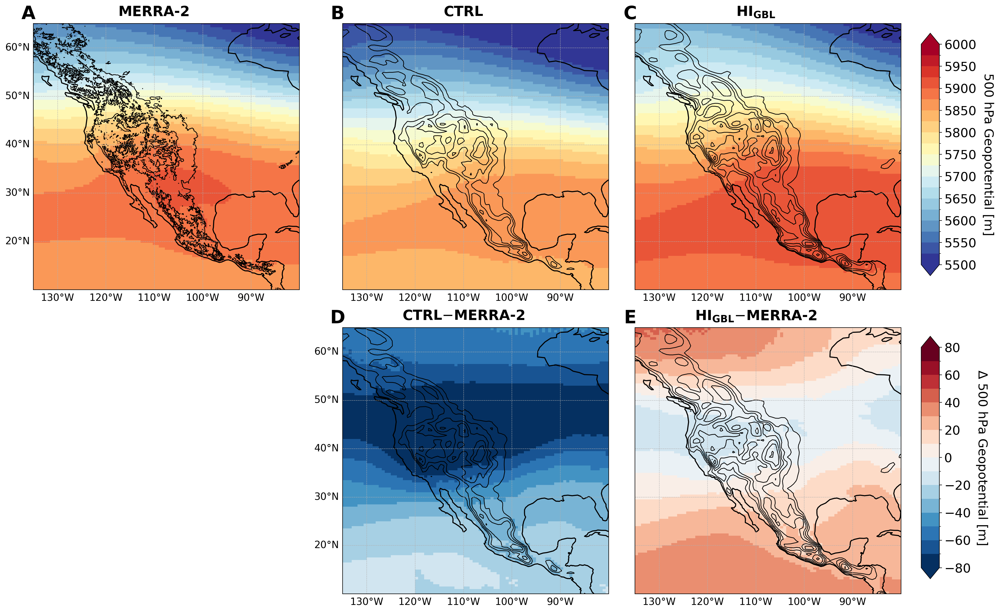

In [26]:
# -------------------- #
#       Settings       #
# -------------------- #
# plot specs
lw=1
text_kw={'color':'k', 'weight':'bold', 'size':20, 'ha':'center', 'va':'bottom'}
text_kw2={'color':'k', 'weight':'bold', 'size':26, 'ha':'center', 'va':'center'}
text_kw3={'color':'k', 'weight':'normal', 'size':14, 'ha':'left', 'va':'center'}
titles=np.array(['MERRA-2','CTRL',r'HI$\mathbf{_{GBL}}$',
                 '','CTRL$-$MERRA-2', r'HI$\mathbf{_{GBL}}$$-$MERRA-2'])
letters=['A','B','C','D','D','E','F']
tx=-110
ty=66
# var specs
lon = jas_mean['pi']['ctrl']['h500'].lon
lat = jas_mean['pi']['ctrl']['h500'].lat
# topography contours
zlevels=np.linspace(1000,4000,8)
# climo colormap
cmap=cm.RdYlBu_r
vmin=5500
vmax=6000
levels=np.linspace(vmin, vmax, 21)
norm=mpl.colors.BoundaryNorm(levels, cmap.N)
hlevels=np.arange(vmin-50, vmax+50, 25)
# bias colormap
dcmap=cm.RdBu_r
dvmin=-80
dvmax=80
dlevels=np.linspace(dvmin, dvmax, 17)
dnorm=mpl.colors.BoundaryNorm(dlevels, dcmap.N)
# map specs
trans=ccrs.PlateCarree()
proj=ccrs.PlateCarree()
map_bnds=[225,280,10,65]
cols=[0,2]

fig, ax = plt.subplots(nrows=2, ncols=3, figsize=(18,12), layout='constrained', subplot_kw={'projection':proj})

# --- h500 climo --- #
ax[0,0].pcolormesh(mlon, mlat, jas_mean['obs']['merra2']['h500'].squeeze(), cmap=cmap, norm=norm, transform=trans)
ax[0,0].contour(topo['etopo'].lon, topo['etopo'].lat, topo['etopo'], levels=np.linspace(1000,4000,4), linewidths=1, colors='black', transform=trans)

for i,run in enumerate(jas_mean['pi'].keys()):
    h500 = jas_mean['pi'][run]['h500']
    topo_ = topo[run]
    
    cf=ax[0,i+1].pcolormesh(h500.lon, h500.lat, h500, cmap=cmap, norm=norm, transform=trans)
    ax[0,i+1].contour(topo_.lon, topo_.lat, topo_, levels=zlevels, linewidths=1, colors='black', transform=trans)

# --- h500 biases --- #
ax[1,0].set_visible(False)

for i,run in enumerate(jas_mean['pi'].keys()):
    dh500 = obs_diff['pi'][run]['h500']
    topo_ = topo[run]
    
    cf2=ax[1,i+1].pcolormesh(dh500.lon, dh500.lat, dh500, cmap=dcmap, norm=dnorm, transform=trans)
    ax[1,i+1].contour(topo_.lon, topo_.lat, topo_, levels=zlevels, linewidths=1, colors='black', transform=trans)
    
for i, ax in enumerate(ax.flat): 
    # subplot labels
    ax.text(-136, ty+1, letters[i], **text_kw2)
    ax.text(tx, ty, titles[i], **text_kw)
    # map properties
    ax.coastlines(color='k', linewidth=1.5)
    ax.set_extent(map_bnds, crs=trans)
    gl=ax.gridlines(crs=trans, lw=.5, colors='black', alpha=1.0, linestyle='--', zorder=10, draw_labels=True)
    gl.bottom_labels=True; gl.left_labels=(i in {0,3,4}); gl.top_labels=False; gl.right_labels=False
    gl.xformatter=LONGITUDE_FORMATTER
    gl.yformatter=LATITUDE_FORMATTER
    gl.xlabel_style={'color': 'black', 'weight': 'normal', 'size':14}
    gl.ylabel_style={'color': 'black', 'weight': 'normal', 'size':14}

# climo
cax=fig.add_axes([1.01, .55, 0.02, 0.4])
cbar=fig.colorbar(cf, ticks=np.linspace(5500,6000,11), orientation='vertical', extend='both', cax=cax) 
cbar.set_label('500 hPa Geopotential [m]', size=18, ha='center', rotation=270, labelpad=25)
cbar.ax.tick_params(labelsize=18)

# bias
cax=fig.add_axes([1.01, .05, 0.02, 0.4])
cbar=fig.colorbar(cf2, ticks=np.linspace(-80,80,9), orientation='vertical', extend='both', cax=cax) 
cbar.set_label('$\Delta$ 500 hPa Geopotential [m]', size=18, ha='center', rotation=270, labelpad=25)
cbar.ax.tick_params(labelsize=18)

plt.savefig('../figs/h500.swp.flor.pi.climo.pdf', transparent=False, bbox_inches='tight')
plt.savefig('../figs/h500.swp.flor.pi.climo.png', transparent=False, bbox_inches='tight')

## h500 climatology and stationary wave pattern

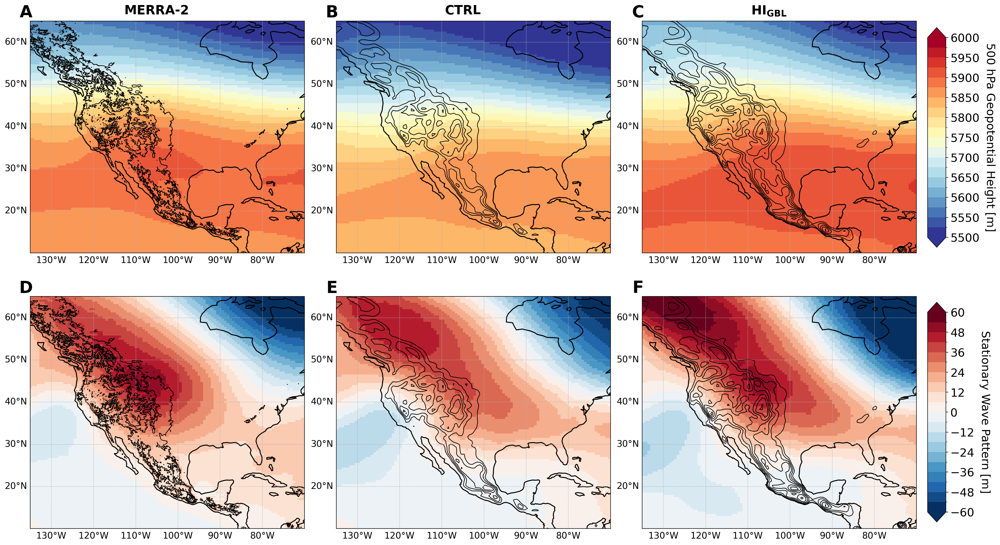

In [27]:
# -------------------- #
#       Settings       #
# -------------------- #
# plot specs
lw=1
text_kw={'color':'k', 'weight':'bold', 'size':20, 'ha':'center', 'va':'bottom'}
text_kw2={'color':'k', 'weight':'bold', 'size':26, 'ha':'center', 'va':'center'}
text_kw3={'color':'k', 'weight':'normal', 'size':14, 'ha':'left', 'va':'center'}
titles=np.array(['MERRA-2','CTRL',r'HI$\mathbf{_{GBL}}$',
                 '','',''])
letters=['A','B','C','D','E','F']
tx=-105
ty=66
# var specs
lon = jas_mean['pi']['ctrl']['h500'].lon
lat = jas_mean['pi']['ctrl']['h500'].lat
# topography contours
zlevels=np.linspace(1000,4000,8)
# climo colormap
cmap=cm.RdYlBu_r
vmin=5500
vmax=6000
levels=np.linspace(vmin, vmax, 21)
norm=mpl.colors.BoundaryNorm(levels, cmap.N)
hlevels=np.arange(vmin-50, vmax+50, 25)
# bias colormap
dcmap=cm.RdBu_r
dvmin=-60
dvmax=60
dlevels=np.linspace(dvmin, dvmax, 21)
dnorm=mpl.colors.BoundaryNorm(dlevels, dcmap.N)
# map specs
trans=ccrs.PlateCarree()
proj=ccrs.PlateCarree()
map_bnds=[225,290,10,65]
cols=[0,2]

fig, ax = plt.subplots(nrows=2, ncols=3, figsize=(20,12), layout='constrained', subplot_kw={'projection':proj})

for i,title in enumerate(['MERRA-2', 'CTRL', r'HI$\mathbf{_{GBL}}$']):
    ax[0,i].text(tx, ty, title, **text_kw)
    
#=== OBS ===
mlon = jas_mean['obs']['merra2']['h500'].lon
mlat = jas_mean['obs']['merra2']['h500'].lat
ax[0,0].pcolormesh(mlon, mlat, jas_mean['obs']['merra2']['h500'].squeeze(), cmap=cmap, norm=norm, transform=trans)
#ax[0,0].contour(mlon, mlat, jas_mean['obs']['merra2']['h500'], colors='k', levels=hlevels, linewidth=1.5, transform=trans)
ax[0,0].contour(topo['etopo'].lon, topo['etopo'].lat, topo['etopo'], levels=np.linspace(1000,4000,4), linewidths=1, colors='black', transform=trans)

ax[1,0].pcolormesh(mlon, mlat, jas_mean['obs']['merra2']['swp500'].squeeze(), cmap=dcmap, norm=dnorm, transform=trans)
ax[1,0].contour(topo['etopo'].lon, topo['etopo'].lat, topo['etopo'], levels=np.linspace(1000,4000,4), linewidths=1, colors='black', transform=trans)

#=== FLOR ===
ax[0,1].pcolormesh(lon, lat, jas_mean['pi']['ctrl']['h500'], cmap=cmap, norm=norm, transform=trans)
cf=ax[0,2].pcolormesh(lon, lat, jas_mean['pi']['hitopo']['h500'], cmap=cmap, norm=norm, transform=trans)

ax[1,1].pcolormesh(lon, lat, jas_mean['pi']['ctrl']['swp500'], cmap=dcmap, norm=dnorm, transform=trans)
cf2=ax[1,2].pcolormesh(lon, lat, jas_mean['pi']['hitopo']['swp500'], cmap=dcmap, norm=dnorm, transform=trans)

for i,run in enumerate(['ctrl','hitopo']):
    ax[0,i+1].contour(lon, lat, topo[run], levels=zlevels, linewidths=1, colors='black', transform=trans)
    ax[1,i+1].contour(lon, lat, topo[run], levels=zlevels, linewidths=1, colors='black', transform=trans)
    
for i, ax in enumerate(ax.flat): 
    # subplot labels
    ax.text(-136, ty+1, letters[i], **text_kw2)
    # map properties
    ax.coastlines(color='k', linewidth=1.5)
    ax.set_extent(map_bnds, crs=trans)
    gl=ax.gridlines(crs=trans, lw=.5, colors='black', alpha=1.0, linestyle='--', zorder=10, draw_labels=True)
    gl.bottom_labels=True; gl.left_labels=True; gl.top_labels=False; gl.right_labels=False
    gl.xformatter=LONGITUDE_FORMATTER
    gl.yformatter=LATITUDE_FORMATTER
    gl.xlabel_style={'color': 'black', 'weight': 'normal', 'size':14}
    gl.ylabel_style={'color': 'black', 'weight': 'normal', 'size':14}

# climo
cax=fig.add_axes([1.01, .55, 0.02, 0.4])
cbar=fig.colorbar(cf, ticks=np.linspace(5500,6000,11), orientation='vertical', extend='both', cax=cax) 
cbar.set_label('500 hPa Geopotential Height [m]', size=18, ha='center', rotation=270, labelpad=25)
cbar.ax.tick_params(labelsize=18)

# bias
cax=fig.add_axes([1.01, .05, 0.02, 0.4])
cbar=fig.colorbar(cf2, ticks=np.linspace(-60,60,11), orientation='vertical', extend='both', cax=cax) 
cbar.set_label('Stationary Wave Pattern [m]', size=18, ha='center', rotation=270, labelpad=25)
cbar.ax.tick_params(labelsize=18)

#plt.savefig('../figs/h500.swp.flor.pi.climo.pdf', transparent=False, bbox_inches='tight')
#plt.savefig('../figs/h500.swp.flor.pi.climo.png', transparent=False, bbox_inches='tight')

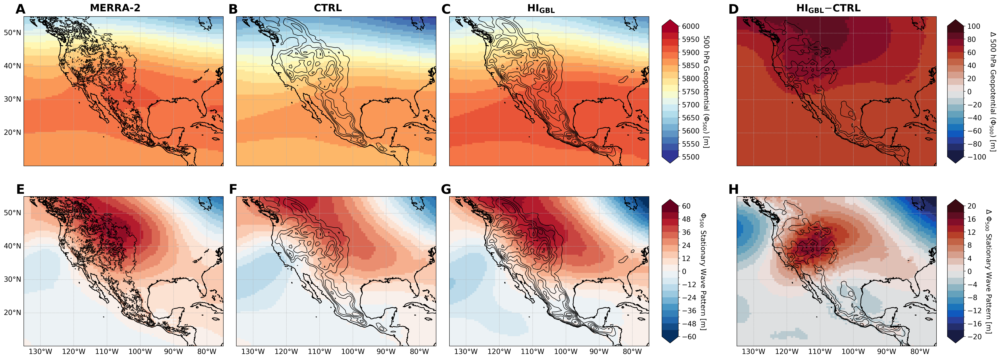

In [33]:
# -------------------- #
#       Settings       #
# -------------------- #
# plot specs
lw=1
text_kw={'color':'k', 'weight':'bold', 'size':20, 'ha':'center', 'va':'bottom'}
text_kw2={'color':'k', 'weight':'bold', 'size':26, 'ha':'center', 'va':'center'}
text_kw3={'color':'k', 'weight':'normal', 'size':14, 'ha':'left', 'va':'center'}
titles=np.array(['MERRA-2','CTRL',r'HI$\mathbf{_{GBL}}$',
                 '','',''])
letters=['A','B','C','D','E','F','G','H']
tx=-107.5
ty=56
# var specs
lon = jas_mean['pi']['ctrl']['h500'].lon
lat = jas_mean['pi']['ctrl']['h500'].lat
# topography contours
zlevels=np.linspace(1000,4000,8)
# h500 colormap
cmap=cm.RdYlBu_r
vmin=5500
vmax=6000
levels=np.linspace(vmin, vmax, 21)
norm=mpl.colors.BoundaryNorm(levels, cmap.N)
hlevels=np.arange(vmin-50, vmax+50, 25)
# swp500 colormap
dcmap=cm.RdBu_r
dvmin=-60
dvmax=60
dlevels=np.linspace(dvmin, dvmax, 21)
dnorm=mpl.colors.BoundaryNorm(dlevels, dcmap.N)
# diff colormap
dcmap2=cmo.balance
# map specs
trans=ccrs.PlateCarree()
proj=ccrs.PlateCarree()
map_bnds=[225,285,10,55]
cols=[0,2]

fig, ax = plt.subplots(nrows=2, ncols=4, figsize=(26,10), layout='constrained', subplot_kw={'projection':proj})

for i,title in enumerate(['MERRA-2', 'CTRL', r'HI$\mathbf{_{GBL}}$', r'HI$\mathbf{_{GBL}}$$-$CTRL']):
    ax[0,i].text(tx, ty, title, **text_kw)
    
#=== OBS ===
mlon = jas_mean['obs']['merra2']['h500'].lon
mlat = jas_mean['obs']['merra2']['h500'].lat
ax[0,0].pcolormesh(mlon, mlat, jas_mean['obs']['merra2']['h500'].squeeze(), cmap=cmap, norm=norm, transform=trans)
#ax[0,0].contour(mlon, mlat, jas_mean['obs']['merra2']['h500'], colors='k', levels=hlevels, linewidth=1.5, transform=trans)
ax[0,0].contour(topo['etopo'].lon, topo['etopo'].lat, topo['etopo'], levels=np.linspace(1000,4000,4), linewidths=1, colors='black', transform=trans)

ax[1,0].pcolormesh(mlon, mlat, jas_mean['obs']['merra2']['swp500'].squeeze(), cmap=dcmap, norm=dnorm, transform=trans)
ax[1,0].contour(topo['etopo'].lon, topo['etopo'].lat, topo['etopo'], levels=np.linspace(1000,4000,4), linewidths=1, colors='black', transform=trans)

#=== FLOR ===
ax[0,1].pcolormesh(lon, lat, jas_mean['pi']['ctrl']['h500'], cmap=cmap, norm=norm, transform=trans)
cf=ax[0,2].pcolormesh(lon, lat, jas_mean['pi']['hitopo']['h500'], cmap=cmap, norm=norm, transform=trans)

ax[1,1].pcolormesh(lon, lat, jas_mean['pi']['ctrl']['swp500'], cmap=dcmap, norm=dnorm, transform=trans)
cf2=ax[1,2].pcolormesh(lon, lat, jas_mean['pi']['hitopo']['swp500'], cmap=dcmap, norm=dnorm, transform=trans)

for i,run in enumerate(['ctrl','hitopo']):
    ax[0,i+1].contour(lon, lat, topo[run], levels=zlevels, linewidths=1, colors='black', transform=trans)
    ax[1,i+1].contour(lon, lat, topo[run], levels=zlevels, linewidths=1, colors='black', transform=trans)

#=== FLOR CHANGE ===
ax[0,3].text(-160,40,' ')
cf3=ax[0,3].pcolormesh(lon, lat, jas_mean['pi']['hitopo']['h500']-jas_mean['pi']['ctrl']['h500'], cmap=dcmap2, norm=mpl.colors.BoundaryNorm(np.linspace(-100, 100, 21), dcmap2.N), transform=trans)
cf4=ax[1,3].pcolormesh(lon, lat, jas_mean['pi']['hitopo']['swp500']-jas_mean['pi']['ctrl']['swp500'], cmap=dcmap2, norm=mpl.colors.BoundaryNorm(np.linspace(-20, 20, 21), dcmap2.N), transform=trans)
ax[0,3].contour(lon, lat, topo['hitopo']-topo['ctrl'], levels=np.linspace(500,1500,5), linewidths=1, colors='black', transform=trans)
ax[1,3].contour(lon, lat, topo['hitopo']-topo['ctrl'], levels=np.linspace(500,1500,5), linewidths=1, colors='black', transform=trans)

for i, ax in enumerate(ax.flat): 
    # subplot labels
    ax.text(-136, ty+1, letters[i], **text_kw2)
    # map properties
    ax.coastlines(color='k', linewidth=1.5)
    ax.set_extent(map_bnds, crs=trans)
    gl=ax.gridlines(crs=trans, lw=.5, colors='black', alpha=1.0, linestyle='--', zorder=10, draw_labels=True)
    gl.bottom_labels=(i in {4,5,6,7}); gl.left_labels=(i in {0,4}); gl.top_labels=False; gl.right_labels=False
    gl.xformatter=LONGITUDE_FORMATTER
    gl.yformatter=LATITUDE_FORMATTER
    gl.xlabel_style={'color': 'black', 'weight': 'normal', 'size':14}
    gl.ylabel_style={'color': 'black', 'weight': 'normal', 'size':14}

# h500
cax=fig.add_axes([.705, .55, 0.0175, 0.4])
cbar=fig.colorbar(cf, ticks=np.linspace(5500,6000,11), orientation='vertical', extend='both', cax=cax) 
cbar.set_label('500 hPa Geopotential ($\Phi_{500}$) [m]', size=14, rotation=270, labelpad=20, ha='center')
cbar.ax.tick_params(labelsize=14)
# swp500
cax=fig.add_axes([.705, .05, 0.0175, 0.4])
cbar=fig.colorbar(cf2, ticks=np.linspace(-60,60,11), orientation='vertical', extend='both', cax=cax) 
cbar.set_label('$\Phi_{500}$ Stationary Wave Pattern [m]', size=14, rotation=270, labelpad=20, ha='center')
cbar.ax.tick_params(labelsize=14)
# h500 change
cax=fig.add_axes([1.01, .55, 0.0174, 0.4])
cbar=fig.colorbar(cf3, ticks=np.linspace(-100,100,11), orientation='vertical', extend='both', cax=cax) 
cbar.set_label('$\Delta$ 500 hPa Geopotential ($\Phi_{500}$) [m]', size=14, rotation=270, labelpad=20, ha='center')
cbar.ax.tick_params(labelsize=14)
# swp500 change
cax=fig.add_axes([1.01, .05, 0.0175, 0.4])                                 
cbar=fig.colorbar(cf4, ticks=np.linspace(-20,20,11), orientation='vertical', extend='both', cax=cax) 
cbar.set_label('$\Delta$ $\Phi_{500}$ Stationary Wave Pattern [m]', size=14, rotation=270, labelpad=20, ha='center')
cbar.ax.tick_params(labelsize=14)

plt.savefig('../figs/h500_swp_flor_pi_climo_change.pdf', transparent=False, bbox_inches='tight')
plt.savefig('../figs/h500_swp_flor_pi_climo_change.png', transparent=False, bbox_inches='tight')

## impact of HI_gbl on model and model bias (pi only)

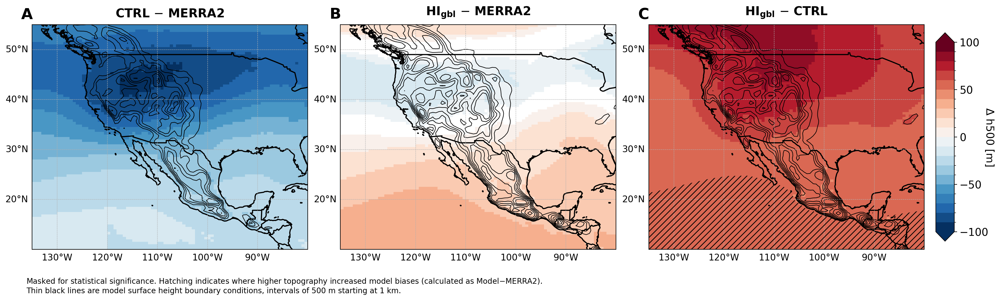

In [11]:
# -------------------- #
#       Settings       #
# -------------------- #
# plot specs
lw=1
text_kw={'color':'k', 'weight':'bold', 'size':16, 'ha':'center', 'va':'bottom'}
text_kw2={'color':'k', 'weight':'bold', 'size':20, 'ha':'center', 'va':'center'}
text_kw3={'color':'k', 'weight':'normal', 'size':10, 'ha':'left', 'va':'center'}
titles=np.array(['CTRL $-$ MERRA2', r'HI$\mathbf{_{gbl}}$ $-$ MERRA2', r'HI$\mathbf{_{gbl}}$ $-$ CTRL'])
letters=['A','B','C','D']
tx=-107.5
ty=56
# var specs
lon = jas_mean['pi']['ctrl']['h500'].lon
lat = jas_mean['pi']['ctrl']['h500'].lat
# topography contours
zlevels=np.linspace(1000,3000,7)
# climo colormap
cmap=cm.RdYlBu_r
vmin=5500
vmax=6000
levels=np.linspace(vmin, vmax, 21)
norm=mpl.colors.BoundaryNorm(levels, cmap.N)
hlevels=np.arange(vmin-50, vmax+50, 25)
# bias colormap
dcmap=cm.RdBu_r
dvmin=-100
dvmax=100
dlevels=np.linspace(dvmin, dvmax, 21)
dnorm=mpl.colors.BoundaryNorm(dlevels, dcmap.N)
# map specs
trans=ccrs.PlateCarree()
proj=ccrs.PlateCarree()
map_bnds=[225,280,10,55]
cols=[0,2]


# ------------------- #
#      Make Plot      #
# ------------------- #
fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(17,5.5), layout='constrained', subplot_kw={'projection':proj})

#fig.text(.5,1.0,f'Modified Topo $-$ CTRL', **text_kw)
fig.text(0.025,0,
         'Masked for statistical significance. Hatching indicates where higher topography increased model biases (calculated as Model$-$MERRA2).\n'
         'Thin black lines are model surface height boundary conditions, intervals of 500 m starting at 1 km.',
         **text_kw3)

#=== CTRL ===
for i,run in enumerate(['ctrl','hitopo']):
    cf=ax[i].pcolormesh(lon, lat, obs_diff_mask['pi'][run]['h500'], cmap=dcmap, norm=dnorm, transform=trans)
    ax[i].contour(lon, lat, topo[run], levels=zlevels, linewidths=.8, colors='black', transform=trans)

#=== HI-GBL ===
ax[2].pcolormesh(lon, lat, model_diff_mask['pi']['hitopo']['h500'], cmap=dcmap, norm=dnorm, transform=trans)
ax[2].contour(lon, lat, topo['hitopo'], levels=zlevels, linewidths=.8, colors='black', transform=trans)
# add hatching where bias got worse
ax[2].contourf(lon, lat, bias_change_masked['pi']['hitopo']['h500'],
               0, colors='none', hatches=['','///'], extend='lower', zorder=100, transform=trans)

for i, ax in enumerate(ax.flat): 
    # subplot labels
    ax.text(tx, ty, titles[i], **text_kw)
    ax.text(-136, ty+1, letters[i], **text_kw2)
    # map properties
    ax.coastlines(color='k', linewidth=1.5)
    ax.add_feature(cfeature.BORDERS, edgecolor='k', linewidth=1.5)
    ax.set_extent(map_bnds, crs=trans)
    gl=ax.gridlines(crs=trans, lw=.5, colors='black', alpha=1.0, linestyle='--', zorder=10, draw_labels=True)
    gl.bottom_labels=True; gl.left_labels=True; gl.top_labels=False; gl.right_labels=False
    gl.xformatter=LONGITUDE_FORMATTER
    gl.yformatter=LATITUDE_FORMATTER
    gl.xlabel_style={'color': 'black', 'weight': 'normal', 'size':12}
    gl.ylabel_style={'color': 'black', 'weight': 'normal', 'size':12}

# colorbar
cax=fig.add_axes([1.01, 0.15, 0.02, 0.7])
cbar=fig.colorbar(cf, ticks=np.linspace(-100,100,5), orientation='vertical', extend='both', cax=cax)
cbar.set_label('$\Delta$ h500 [m]', labelpad=8, rotation=270, size=14, fontweight='normal', ha='center')
cbar.ax.tick_params(labelsize=14)
for tick in cbar.ax.yaxis.get_major_ticks():
    tick.label2.set_fontweight('normal')

#plt.savefig(f'{opath}/slp.flor.e3.nam-change.{season}.pdf', transparent=False, bbox_inches='tight')

## impact of HIgbl on model bias and future change

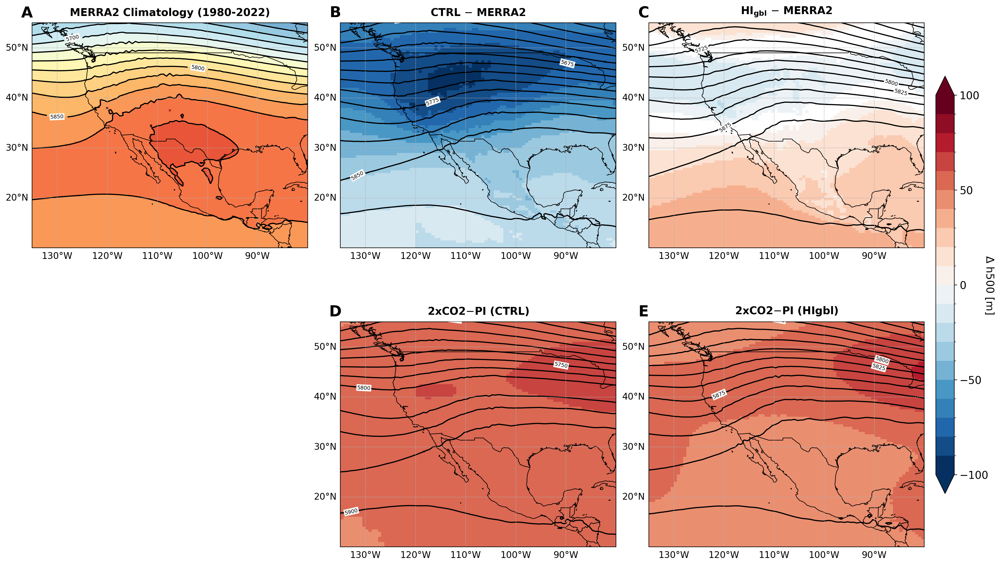

In [18]:
# -------------------- #
#       Settings       #
# -------------------- #
# plot specs
lw=1
text_kw={'color':'k', 'weight':'bold', 'size':14, 'ha':'center', 'va':'bottom'}
text_kw2={'color':'k', 'weight':'bold', 'size':20, 'ha':'center', 'va':'center'}
text_kw3={'color':'k', 'weight':'normal', 'size':10, 'ha':'left', 'va':'center'}
titles=np.array(['MERRA2 Climatology (1980-2022)', 'CTRL $-$ MERRA2', r'HI$\mathbf{_{gbl}}$ $-$ MERRA2',
                '', '2xCO2$-$PI (CTRL)','2xCO2$-$PI (HIgbl)'])
letters=['A','B','C','D','D','E']
tx=-107.5
ty=56
# var specs
lon = jas_mean['pi']['ctrl']['h500'].lon
lat = jas_mean['pi']['ctrl']['h500'].lat
# topography contours
zlevels=np.linspace(1000,3000,7)
# climo colormap
cmap=cm.RdYlBu_r
vmin=5500
vmax=6000
levels=np.linspace(vmin, vmax, 21)
norm=mpl.colors.BoundaryNorm(levels, cmap.N)
hlevels=np.arange(vmin-50, vmax+50, 25)
# bias colormap
dcmap=cm.RdBu_r
dvmin=-100
dvmax=100
dlevels=np.linspace(dvmin, dvmax, 21)
dnorm=mpl.colors.BoundaryNorm(dlevels, dcmap.N)
# map specs
trans=ccrs.PlateCarree()
proj=ccrs.PlateCarree()
map_bnds=[225,280,10,55]
cols=[0,2]


# ------------------- #
#      Make Plot      #
# ------------------- #
fig, ax = plt.subplots(nrows=2, ncols=3, figsize=(17,11), layout='constrained', subplot_kw={'projection':proj})

#=== MERRA2 ===
mlon = jas_mean['obs']['merra2']['h500'].lon
mlat = jas_mean['obs']['merra2']['h500'].lat
ax[0,0].pcolormesh(mlon, mlat, jas_mean['obs']['merra2']['h500'].squeeze(), cmap=cmap, norm=norm, transform=trans)
cs=ax[0,0].contour(mlon, mlat, jas_mean['obs']['merra2']['h500'], colors='k', levels=hlevels, linewidth=1.5, transform=trans)
labels=ax[0,0].clabel(cs, inline=True, inline_spacing=-10, fontsize=7, fmt="%.0f")
for txt in labels:
    txt.set_bbox(dict(facecolor='white', edgecolor='none', pad=1))
#ax[0].contour(topo['etopo'].lon, topo['etopo'].lat, topo['etopo'], levels=np.linspace(1000,4000,4), linewidths=1, colors='black', transform=trans)

#=== PI Bias ===
for i,run in enumerate(['ctrl','hitopo']):
    cf=ax[0,i+1].pcolormesh(lon, lat, obs_diff_mask['pi'][run]['h500'], cmap=dcmap, norm=dnorm, transform=trans)
    cs=ax[0,i+1].contour(lon, lat, jas_mean['pi'][run]['h500'], colors='k', levels=hlevels, linewidth=1.5, transform=trans)
    labels=ax[0,i+1].clabel(cs, inline=True, inline_spacing=-15, fontsize=7, fmt="%.0f")
    for txt in labels:
        txt.set_bbox(dict(facecolor='white', edgecolor='none', pad=1))
    #ax[i+1].contour(lon, lat, topo[run], levels=zlevels, linewidths=.8, colors='black', transform=trans)

#=== 2xCO2 Change ===
ax[1,0].set_visible(False)
for i,run in enumerate(['ctrl','hitopo']):
    cf=ax[1,i+1].pcolormesh(lon, lat, future_diff_mask[run]['h500'], cmap=dcmap, norm=dnorm, transform=trans)
    cs=ax[1,i+1].contour(lon, lat, jas_mean['2xco2'][run]['h500'], colors='k', levels=hlevels, linewidth=1.5, transform=trans)
    labels=ax[1,i+1].clabel(cs, inline=True, inline_spacing=-15, fontsize=7, fmt="%.0f")
    for txt in labels:
        txt.set_bbox(dict(facecolor='white', edgecolor='none', pad=1))
        
for i, ax in enumerate(ax.flat): 
    # subplot labels
    ax.text(tx, ty, titles[i], **text_kw)
    ax.text(-136, ty+1, letters[i], **text_kw2)
    # map properties
    ax.coastlines(color='k', linewidth=.8)
    ax.add_feature(cfeature.BORDERS, edgecolor='k', linewidth=.8)
    ax.set_extent(map_bnds, crs=trans)
    gl=ax.gridlines(crs=trans, lw=.5, colors='black', alpha=1.0, linestyle='--', zorder=10, draw_labels=True)
    gl.bottom_labels=True; gl.left_labels=True; gl.top_labels=False; gl.right_labels=False
    gl.xformatter=LONGITUDE_FORMATTER
    gl.yformatter=LATITUDE_FORMATTER
    gl.xlabel_style={'color': 'black', 'weight': 'normal', 'size':12}
    gl.ylabel_style={'color': 'black', 'weight': 'normal', 'size':12}

# colorbar
cax=fig.add_axes([1.01, 0.15, 0.02, 0.7])
cbar=fig.colorbar(cf, ticks=np.linspace(-100,100,5), orientation='vertical', extend='both', cax=cax)
cbar.set_label('$\Delta$ h500 [m]', labelpad=8, rotation=270, size=14, fontweight='normal', ha='center')
cbar.ax.tick_params(labelsize=14)
for tick in cbar.ax.yaxis.get_major_ticks():
    tick.label2.set_fontweight('normal')

plt.show()
#plt.savefig(f'{opath}/slp.flor.e3.nam-change.{season}.pdf', transparent=False, bbox_inches='tight')

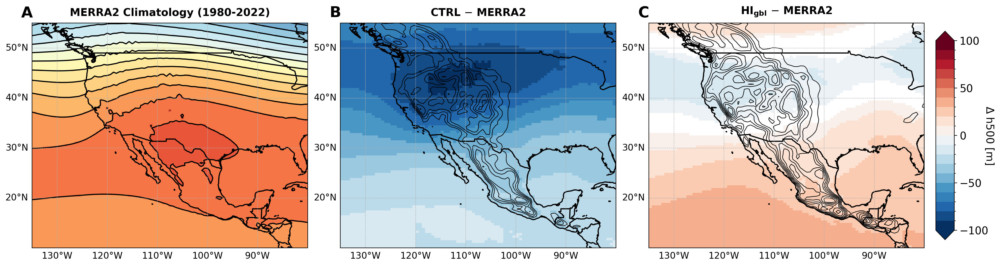

In [12]:
# -------------------- #
#       Settings       #
# -------------------- #
# plot specs
lw=1
text_kw={'color':'k', 'weight':'bold', 'size':14, 'ha':'center', 'va':'bottom'}
text_kw2={'color':'k', 'weight':'bold', 'size':20, 'ha':'center', 'va':'center'}
text_kw3={'color':'k', 'weight':'normal', 'size':10, 'ha':'left', 'va':'center'}
titles=np.array(['MERRA2 Climatology (1980-2022)', 'CTRL $-$ MERRA2', r'HI$\mathbf{_{gbl}}$ $-$ MERRA2'])
letters=['A','B','C','D']
tx=-107.5
ty=56
# var specs
lon = jas_mean['pi']['ctrl']['h500'].lon
lat = jas_mean['pi']['ctrl']['h500'].lat
# topography contours
zlevels=np.linspace(1000,3000,7)
# climo colormap
cmap=cm.RdYlBu_r
vmin=5500
vmax=6000
levels=np.linspace(vmin, vmax, 21)
norm=mpl.colors.BoundaryNorm(levels, cmap.N)
hlevels=np.arange(vmin-50, vmax+50, 25)
# bias colormap
dcmap=cm.RdBu_r
dvmin=-100
dvmax=100
dlevels=np.linspace(dvmin, dvmax, 21)
dnorm=mpl.colors.BoundaryNorm(dlevels, dcmap.N)
# map specs
trans=ccrs.PlateCarree()
proj=ccrs.PlateCarree()
map_bnds=[225,280,10,55]
cols=[0,2]


# ------------------- #
#      Make Plot      #
# ------------------- #
fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(17,5.5), layout='constrained', subplot_kw={'projection':proj})

#=== MERRA2 ===
mlon = jas_mean['obs']['merra2']['h500'].lon
mlat = jas_mean['obs']['merra2']['h500'].lat
ax[0].pcolormesh(mlon, mlat, jas_mean['obs']['merra2']['h500'].squeeze(), cmap=cmap, norm=norm, transform=trans)
ax[0].contour(mlon, mlat, jas_mean['obs']['merra2']['h500'], colors='k', levels=hlevels, linewidth=1.5, transform=trans)
#ax[0].contour(topo['etopo'].lon, topo['etopo'].lat, topo['etopo'], levels=np.linspace(1000,4000,4), linewidths=1, colors='black', transform=trans)

#=== PI Bias ===
for i,run in enumerate(['ctrl','hitopo']):
    cf=ax[i+1].pcolormesh(lon, lat, obs_diff_mask['pi'][run]['h500'], cmap=dcmap, norm=dnorm, transform=trans)
    ax[i+1].contour(lon, lat, topo[run], levels=zlevels, linewidths=.8, colors='black', transform=trans)

for i, ax in enumerate(ax.flat): 
    # subplot labels
    ax.text(tx, ty, titles[i], **text_kw)
    ax.text(-136, ty+1, letters[i], **text_kw2)
    # map properties
    ax.coastlines(color='k', linewidth=1.5)
    ax.add_feature(cfeature.BORDERS, edgecolor='k', linewidth=1.5)
    ax.set_extent(map_bnds, crs=trans)
    gl=ax.gridlines(crs=trans, lw=.5, colors='black', alpha=1.0, linestyle='--', zorder=10, draw_labels=True)
    gl.bottom_labels=True; gl.left_labels=True; gl.top_labels=False; gl.right_labels=False
    gl.xformatter=LONGITUDE_FORMATTER
    gl.yformatter=LATITUDE_FORMATTER
    gl.xlabel_style={'color': 'black', 'weight': 'normal', 'size':12}
    gl.ylabel_style={'color': 'black', 'weight': 'normal', 'size':12}

# colorbar
cax=fig.add_axes([1.01, 0.15, 0.02, 0.7])
cbar=fig.colorbar(cf, ticks=np.linspace(-100,100,5), orientation='vertical', extend='both', cax=cax)
cbar.set_label('$\Delta$ h500 [m]', labelpad=8, rotation=270, size=14, fontweight='normal', ha='center')
cbar.ax.tick_params(labelsize=14)
for tick in cbar.ax.yaxis.get_major_ticks():
    tick.label2.set_fontweight('normal')

#plt.savefig(f'{opath}/slp.flor.e3.nam-change.{season}.pdf', transparent=False, bbox_inches='tight')

### h500 climatology and model bias

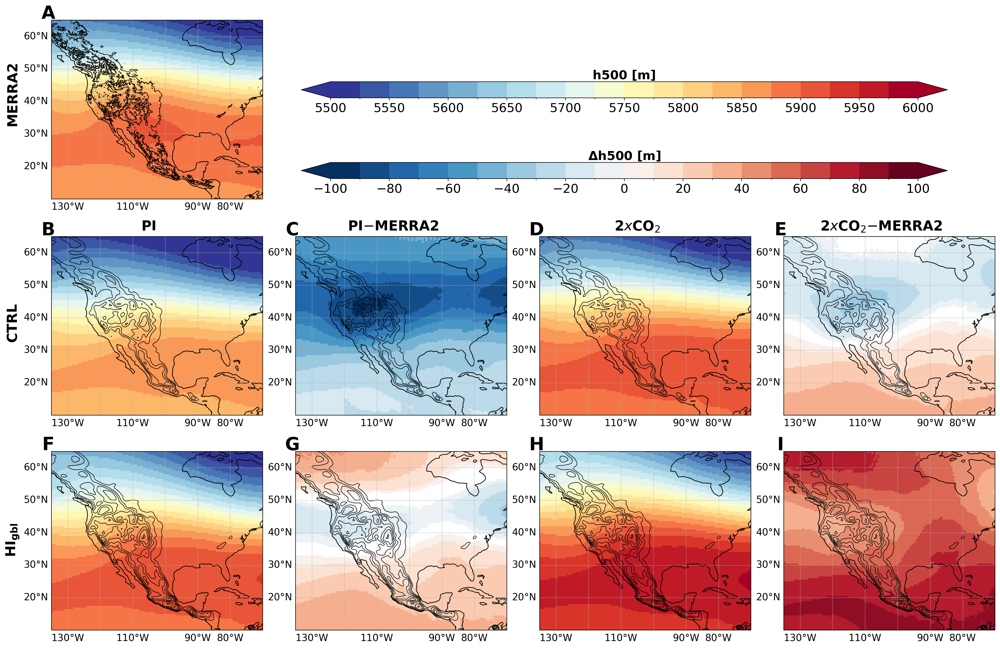

In [13]:
# -------------------- #
#       Settings       #
# -------------------- #
# plot specs
lw=1
text_kw={'color':'k', 'weight':'bold', 'size':20, 'ha':'center', 'va':'bottom'}
text_kw2={'color':'k', 'weight':'bold', 'size':26, 'ha':'center', 'va':'center'}
text_kw3={'color':'k', 'weight':'normal', 'size':14, 'ha':'left', 'va':'center'}
titles=np.array(['MERRA2','CM2.5-FLOR CTRL','CM2.5-FLOR HI-GBL',
                 '','',''])
letters=['A','B','B','B','B','C','D','E','F','G','H','I','J']
tx=-105
ty=66
# var specs
lon = jas_mean['pi']['ctrl']['h500'].lon
lat = jas_mean['pi']['ctrl']['h500'].lat
# topography contours
zlevels=np.linspace(1000,4000,8)
# climo colormap
cmap=cm.RdYlBu_r
vmin=5500
vmax=6000
levels=np.linspace(vmin, vmax, 21)
norm=mpl.colors.BoundaryNorm(levels, cmap.N)
hlevels=np.arange(vmin-50, vmax+50, 25)
# bias colormap
dcmap=cm.RdBu_r
dvmin=-100
dvmax=100
dlevels=np.linspace(dvmin, dvmax, 21)
dnorm=mpl.colors.BoundaryNorm(dlevels, dcmap.N)
# map specs
trans=ccrs.PlateCarree()
proj=ccrs.PlateCarree()
map_bnds=[225,290,10,65]
cols=[0,2]

fig, ax = plt.subplots(nrows=3, ncols=4, figsize=(20,13), layout='constrained', subplot_kw={'projection':proj})

ax[0,0].text(-147,32.5,'MERRA2', rotation=90, **text_kw)
ax[1,0].text(-147,32.5,'CTRL', rotation=90, **text_kw)
ax[2,0].text(-147,32.5,r'HI$\mathbf{_{gbl}}$', rotation=90, **text_kw)
for i,title in enumerate(['PI', 'PI$-$MERRA2', '2$x$CO$_2$', '2$x$CO$_2$$-$MERRA2']):
    ax[1,i].text(tx, ty, title, **text_kw)
    
#=== OBS ===
mlon = jas_mean['obs']['merra2']['h500'].lon
mlat = jas_mean['obs']['merra2']['h500'].lat
ax[0,0].pcolormesh(mlon, mlat, jas_mean['obs']['merra2']['h500'], cmap=cmap, norm=norm, transform=trans)
#ax[0,0].contour(mlon, mlat, jas_mean['obs']['merra2']['h500'], colors='k', levels=hlevels, linewidth=1.5, transform=trans)
ax[0,0].contour(topo['etopo'].lon, topo['etopo'].lat, topo['etopo'], levels=np.linspace(1000,4000,4), linewidths=.75, colors='black', transform=trans)

ax[0,1].set_visible(False)
ax[0,2].set_visible(False)
ax[0,3].set_visible(False)

#=== FLOR ===
run='ctrl'
i=0
for key in ['pi','2xco2']:
    cf=ax[1,i].pcolormesh(lon, lat, jas_mean[key][run]['h500'], cmap=cmap, norm=norm, transform=trans)
    cf2=ax[1,i+1].pcolormesh(lon, lat, obs_diff_mask[key][run]['h500'], cmap=dcmap, norm=dnorm, transform=trans)
    i+=2

run='hitopo'
i=0
for key in ['pi','2xco2']:
    ax[2,i].pcolormesh(lon, lat, jas_mean[key][run]['h500'], cmap=cmap, norm=norm, transform=trans)
    ax[2,i+1].pcolormesh(lon, lat, obs_diff_mask[key][run]['h500'], cmap=dcmap, norm=dnorm, transform=trans)
    i+=2           

for i,run in enumerate(['ctrl','hitopo']):
    for j in [0,1,2,3]:
        ax[i+1,j].contour(lon, lat, topo[run], levels=zlevels, linewidths=.75, colors='black', transform=trans)

for i, ax in enumerate(ax.flat): 
    # subplot labels
    ax.text(-136, ty+1, letters[i], **text_kw2)
    # map properties
    ax.coastlines(color='k', linewidth=1)
    ax.set_extent(map_bnds, crs=trans)
    gl=ax.gridlines(crs=trans, lw=.5, colors='black', alpha=1.0, linestyle='--', zorder=10, draw_labels=True)
    gl.bottom_labels=True; gl.left_labels=True; gl.top_labels=False; gl.right_labels=False
    gl.xformatter=LONGITUDE_FORMATTER
    gl.yformatter=LATITUDE_FORMATTER
    gl.xlabel_style={'color': 'black', 'weight': 'normal', 'size':14}
    gl.ylabel_style={'color': 'black', 'weight': 'normal', 'size':14}

# climo
cax=fig.add_axes([.3, 0.85, 0.65, 0.025])
cbar=fig.colorbar(cf, ticks=np.linspace(5500,6000,11), orientation='horizontal', extend='both', cax=cax) 
cbar.set_label('h500 [m]', labelpad=-65, size=18, fontweight='bold', ha='center')
cbar.ax.tick_params(labelsize=18)

# bias
cax=fig.add_axes([.3, 0.725, 0.65, 0.025])
cbar=fig.colorbar(cf2, ticks=np.linspace(-100,100,11), orientation='horizontal', extend='both', cax=cax) 
cbar.set_label(r'$\mathbf{\Delta}$h500 [m]', labelpad=-65, size=18, fontweight='bold', ha='center')
cbar.ax.tick_params(labelsize=18)

#plt.savefig(f'figs/h500.flor.pi.2xco2.bias.change.pdf', transparent=False, bbox_inches='tight')
#plt.savefig(f'figs/h500.flor.pi.2xco2.bias.change.pdf', transparent=False, bbox_inches='tight')

### h500 climatology for FLOR PI

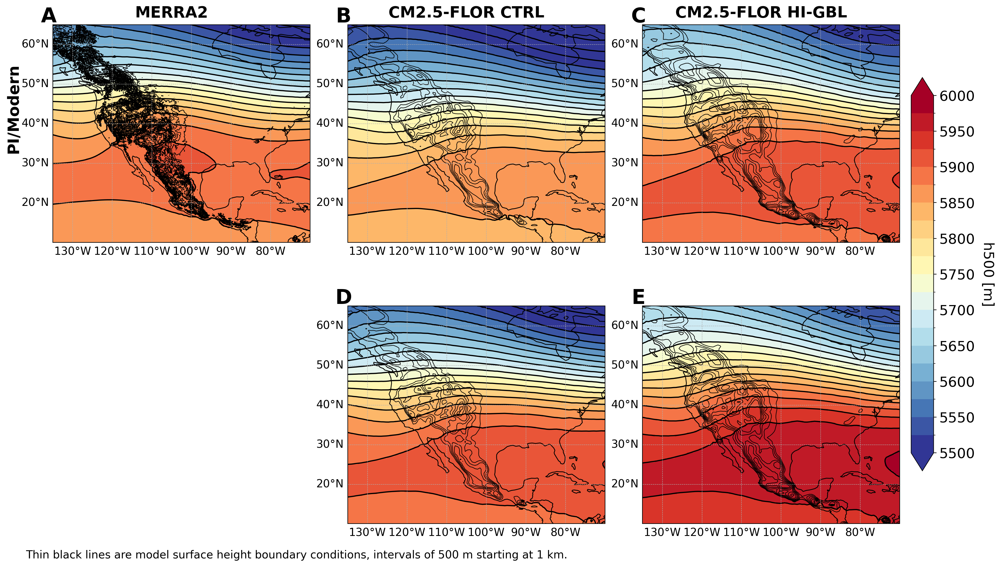

In [14]:
# -------------------- #
#       Settings       #
# -------------------- #
# plot specs
lw=1
text_kw={'color':'k', 'weight':'bold', 'size':20, 'ha':'center', 'va':'bottom'}
text_kw2={'color':'k', 'weight':'bold', 'size':26, 'ha':'center', 'va':'center'}
text_kw3={'color':'k', 'weight':'normal', 'size':14, 'ha':'left', 'va':'center'}
titles=np.array(['MERRA2','CM2.5-FLOR CTRL','CM2.5-FLOR HI-GBL',
                 '','',''])
letters=['A','B','C','D','D','E','F']
tx=-105
ty=66
# var specs
lon = jas_mean['pi']['ctrl']['h500'].lon
lat = jas_mean['pi']['ctrl']['h500'].lat
# topography contours
zlevels=np.linspace(1000,3000,7)
# climo colormap
cmap=cm.RdYlBu_r
vmin=5500
vmax=6000
levels=np.linspace(vmin, vmax, 21)
norm=mpl.colors.BoundaryNorm(levels, cmap.N)
hlevels=np.arange(vmin-50, vmax+50, 25)
# bias colormap
dcmap=cm.RdBu_r
dvmin=-100
dvmax=100
dlevels=np.linspace(dvmin, dvmax, 21)
dnorm=mpl.colors.BoundaryNorm(dlevels, dcmap.N)
# map specs
trans=ccrs.PlateCarree()
proj=ccrs.PlateCarree()
map_bnds=[225,290,10,65]
cols=[0,2]


# ------------------- #
#      Make Plot      #
# ------------------- #
fig, ax = plt.subplots(nrows=2, ncols=3, figsize=(16,10), layout='constrained', subplot_kw={'projection':proj})

#fig.text(.5,1.0,f'Modified Topo $-$ CTRL', **text_kw)
fig.text(0.025,0,
         'Thin black lines are model surface height boundary conditions, intervals of 500 m starting at 1 km.',
         **text_kw3)

#=== OBS ===
ax[0,0].text(-145,32.5,'PI/Modern', rotation=90, **text_kw)
mlon = jas_mean['obs']['merra2']['h500'].lon
mlat = jas_mean['obs']['merra2']['h500'].lat
cf=ax[0,0].pcolormesh(mlon, mlat, jas_mean['obs']['merra2']['h500'], cmap=cmap, norm=norm, transform=trans)
ax[0,0].contour(mlon, mlat, jas_mean['obs']['merra2']['h500'], colors='k', levels=hlevels, linewidth=1.5, transform=trans)
ax[0,0].contour(topo['etopo'].lon, topo['etopo'].lat, topo['etopo'], levels=zlevels, linewidths=.75, colors='black', transform=trans)
#=== CTRL ===
for i,key in enumerate(['pi','2xco2']):
    for j,run in enumerate(['ctrl','hitopo']):
        j=j+1
        ax[i,j].pcolormesh(lon, lat, jas_mean[key][run]['h500'], cmap=cmap, norm=norm, transform=trans)
        ax[i,j].contour(lon, lat, jas_mean[key][run]['h500'], colors='k', levels=hlevels, linewidth=0.75, transform=trans)
        ax[i,j].contour(lon, lat, topo[run], levels=zlevels, linewidths=.75, colors='black', transform=trans)
         
ax[1,0].set_visible(False)

for i, ax in enumerate(ax.flat): 
    # subplot labels
    ax.text(tx, ty, titles[i], **text_kw)
    ax.text(-136, ty+1, letters[i], **text_kw2)
    # map properties
    ax.coastlines(color='k', linewidth=1)
    ax.set_extent(map_bnds, crs=trans)
    gl=ax.gridlines(crs=trans, lw=.5, colors='black', alpha=1.0, linestyle='--', zorder=10, draw_labels=True)
    gl.bottom_labels=True; gl.left_labels=True; gl.top_labels=False; gl.right_labels=False
    gl.xformatter=LONGITUDE_FORMATTER
    gl.yformatter=LATITUDE_FORMATTER
    gl.xlabel_style={'color': 'black', 'weight': 'normal', 'size':14}
    gl.ylabel_style={'color': 'black', 'weight': 'normal', 'size':14}

# colorbar
cax=fig.add_axes([1.01, 0.15, 0.025, 0.7])
cbar=fig.colorbar(cf, ticks=np.linspace(5500,6000,11), orientation='vertical', extend='both', cax=cax) 
cbar.set_label('h500 [m]', labelpad=25, rotation=270, size=18, fontweight='normal', ha='center')
cbar.ax.tick_params(labelsize=18)
for tick in cbar.ax.yaxis.get_major_ticks():
    tick.label2.set_fontweight('normal')

#plt.savefig(f'{opath}/slp.flor.e3.nam-change.{season}.pdf', transparent=False, bbox_inches='tight')